# Carve up 2+1D Spatiotemporal Space with Oriented Gabors

Now, define filters with a 3rd dimension!

In [140]:
%matplotlib ipympl
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from skimage.measure import marching_cubes
pi = np.pi

def gauss_filter_3d(x, y, z, mu_x, mu_y, mu_z, sigma_x, sigma_y, sigma_z, norm=True):
    response = np.exp(-((x - mu_x)**2 / (2 * sigma_x**2) + 
                        (y - mu_y)**2 / (2 * sigma_y**2) + 
                        (z - mu_z)**2 / (2 * sigma_z**2)))
    if norm:
        response = response / ((sigma_x * sigma_y * sigma_z) * (2 * np.pi)**1.5)
    return response

def pol2cart3d(rho, phi, theta):
    x = rho * np.sin(theta) * np.cos(phi)
    y = rho * np.sin(theta) * np.sin(phi)
    z = rho * np.cos(theta)
    return x, y, z

def cart2pol3d(x, y, z):
    #rho = np.sqrt(x**2 + y**2 + z**2)
    #theta = np.arccos(z / rho)
    #phi = np.arctan2(y, x)
    rho = magnitude(x, y, z)
    theta = np.arctan2(sqrt(x * x + y * y), z)
    phi = np.arctan2(y, x)
    return rho, theta, phi

def polar_gaussian_3d(xs, ys, zs, scale, orientation, elevation, phase_offset=0, norm=False):
    mu_x, mu_y, mu_z = pol2cart3d(scale, orientation, elevation)
    scaling_factor = 0.4
    filt_sigma = scale * scaling_factor
    filt = gauss_filter_3d(xs, ys, zs, mu_x, mu_y, mu_z, filt_sigma, filt_sigma, filt_sigma, norm=norm)
    filt = filt * np.exp(1j * phase_offset)
    return filt

def quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=False):
    filter_real = polar_gaussian_3d(xs, ys, zs, scale, orientation, elevation, phase_offset=0, norm=True)
    filter_imag = polar_gaussian_3d(xs, ys, zs, scale, orientation + np.pi, np.pi-elevation, phase_offset=np.pi, norm=True)
    if(separate_pairs):
        filter = (filter_real, 1j*filter_imag)
    else:
        filter = filter_real + 1j*filter_imag
    return filter

## Plot a Demo

First a scatterplot

(-2.0, 2.0)

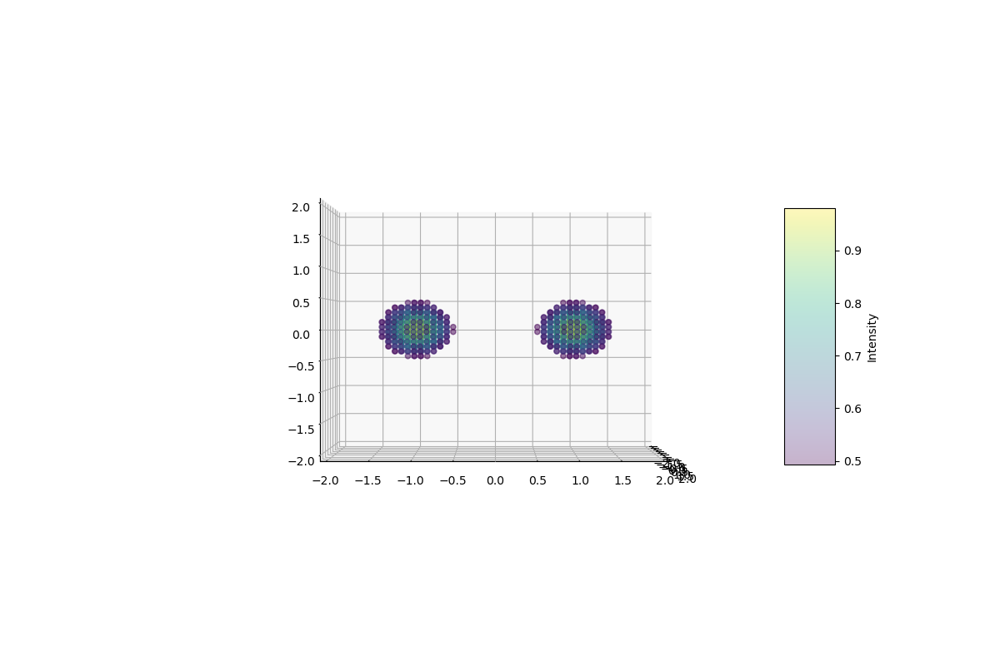

In [141]:
def plot_3d_quadrature_gaussian_filter(scale, orientation, elevation, space=np.linspace(-5, 5, num=50)):
    xs, ys, zs = np.meshgrid(space, space, space)
    
    filter = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=False)
    filter_amplitude = np.abs(filter)
    max_amplitude = np.max(filter_amplitude)
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    ax.view_init(0, 0, 0)

    #filter_amplitudes_normed = filter_amplitude / max_amplitude
    keep_mask = np.where(filter_amplitude > (max_amplitude/2))
    
    scatter = ax.scatter(xs[keep_mask], ys[keep_mask], zs[keep_mask], c=filter_amplitude[keep_mask], cmap='viridis', marker='o', alpha=0.3)
    
    cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
    cbar.set_label('Intensity')

    return(ax)

scale = 1
orientation = pi/2
elevation = pi/2

xyzspace = np.linspace(-2, 2, num=50)

ax = plot_3d_quadrature_gaussian_filter(scale, orientation, elevation, space=xyzspace)
ax.set_xlim(np.min(xyzspace), np.max(xyzspace))
ax.set_ylim(np.min(xyzspace), np.max(xyzspace))
ax.set_zlim(np.min(xyzspace), np.max(xyzspace))

## Demo of Contour Plot

Text(0.5, 0, 'Z')

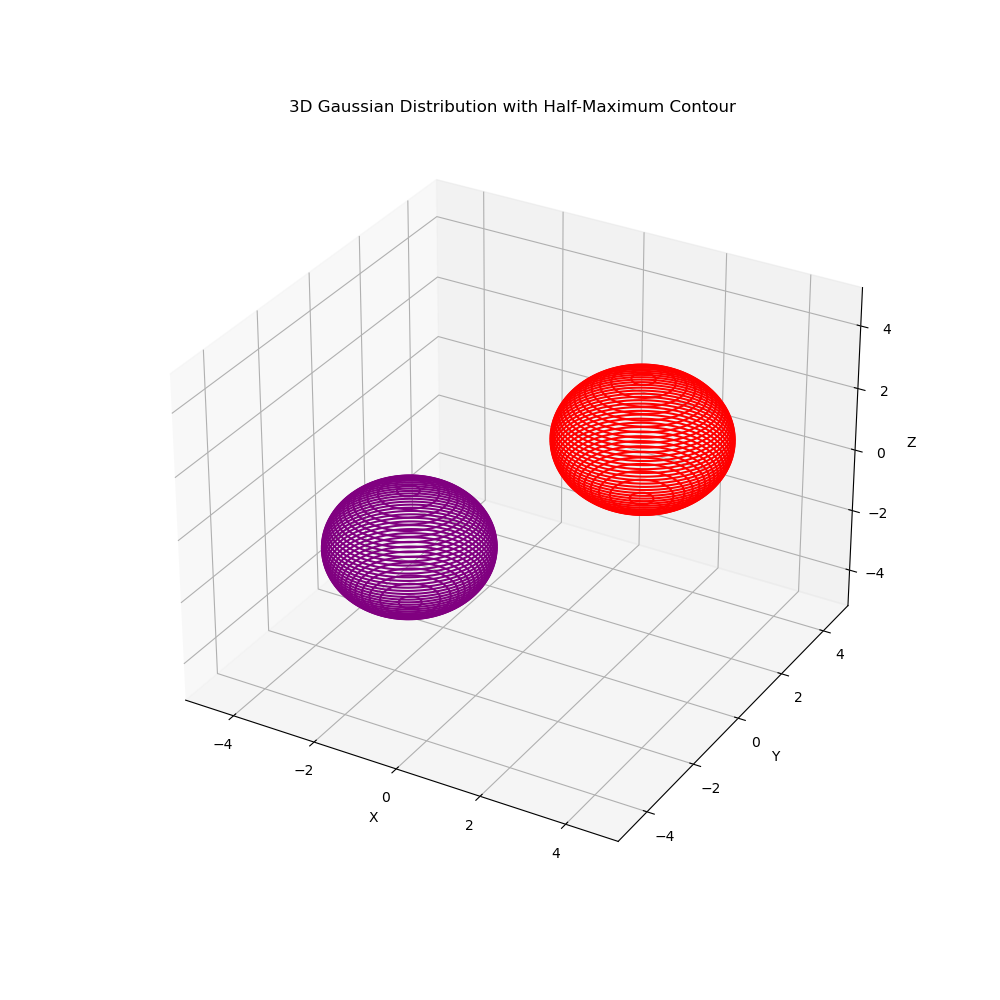

In [196]:
%matplotlib ipympl
from mayavi import mlab
#%matplotlib widget
#3D Heatmap in Python using matplotlib 
def plot_3d_quadrature_gaussian_filter_with_contour(scale, orientation, elevation, space=np.linspace(-5, 5, num=20),ax=None):

    if(ax==None):
        # Create the plot
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(111, projection='3d')
    
    # Setup space progression
    xs, ys, zs = np.meshgrid(space, space, space)
    
    filter_re, filter_im = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=True)
    
    filter_amplitude_re = np.abs(filter_re)
    filter_amplitude_im = np.abs(filter_im)
    
    max_amplitude = np.max((filter_amplitude_re,filter_amplitude_im))

    # Plot the real part as contours
    for z in range(len(space)):
        ax.contour(xs[:, :, z], ys[:, :, z], filter_amplitude_re[:, :, z], levels=[max_amplitude / 2], zdir='z', offset=space[z],colors='red')

    # Plot the imaginary part as contours
    for z in range(len(space)):
        ax.contour(xs[:, :, z], ys[:, :, z], filter_amplitude_im[:, :, z], levels=[max_amplitude / 2], zdir='z', offset=space[z],colors='purple')
    
    return(ax)

scale = 4
orientation = 0
elevation = pi/4

xyzspace = np.linspace(-5, 5, num=100)
ax = plot_3d_quadrature_gaussian_filter_with_contour(scale, orientation, elevation, space=xyzspace)
# Set axis limits based on space
ax.set_xlim(np.min(xyzspace), np.max(xyzspace))
ax.set_ylim(np.min(xyzspace), np.max(xyzspace))
ax.set_zlim(np.min(xyzspace), np.max(xyzspace))

# Additional plot settings
ax.set_title('3D Gaussian Distribution with Half-Maximum Contour')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

## Go through a range of scales and orientations and plot them all

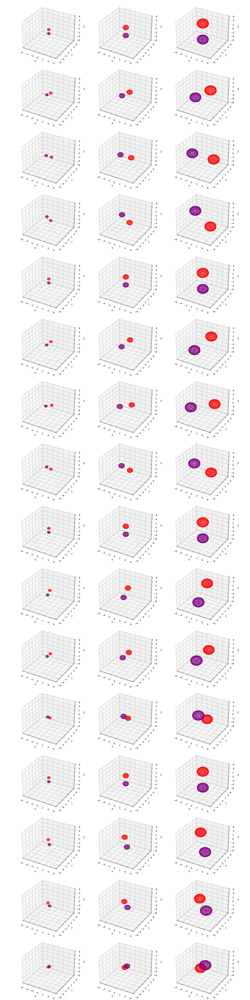

In [208]:
#pick our scales & centers
scales = [1,2,4]
orientations = [0,pi/4,pi/2,3*pi/4]
elevations = [0,pi/4,pi/2,3*pi/4]
#setup space and time progression
width = 6
xyzspace = np.linspace(-1*width,width, num=50)

# Create the figure
fig, axs = plt.subplots(len(orientations) * len(elevations), len(scales), figsize=(15, 60), subplot_kw={'projection': '3d'})

for j, elevation in enumerate(elevations):
    for i, orientation in enumerate(orientations):
        for k, scale in enumerate(scales):
            ax = axs[i * len(elevations) + j, k]
            plot_3d_quadrature_gaussian_filter_with_contour(scale, orientation, elevation, space=xyzspace, ax=ax)
            ax.set_xlim(np.min(xyzspace), np.max(xyzspace))
            ax.set_ylim(np.min(xyzspace), np.max(xyzspace))
            ax.set_zlim(np.min(xyzspace), np.max(xyzspace))
            ax.set_xlabel('X')
            ax.set_ylabel('Y')
            ax.set_zlabel('Z')

            #x, y, z = np.array([[-1*width,0,0],[0,-1*width,0],[0,0,0]])
            #u, v, w = np.array([[2*width,0,0],[0,width,0],[0,0,5*width]])
            #ax.quiver(x,y,z,u,v,w,arrow_length_ratio=0.1, color="black")
            #ax.set_axis_off()
        
plt.tight_layout()
plt.show()


## Plot them all on the same axis to see if this makes sense

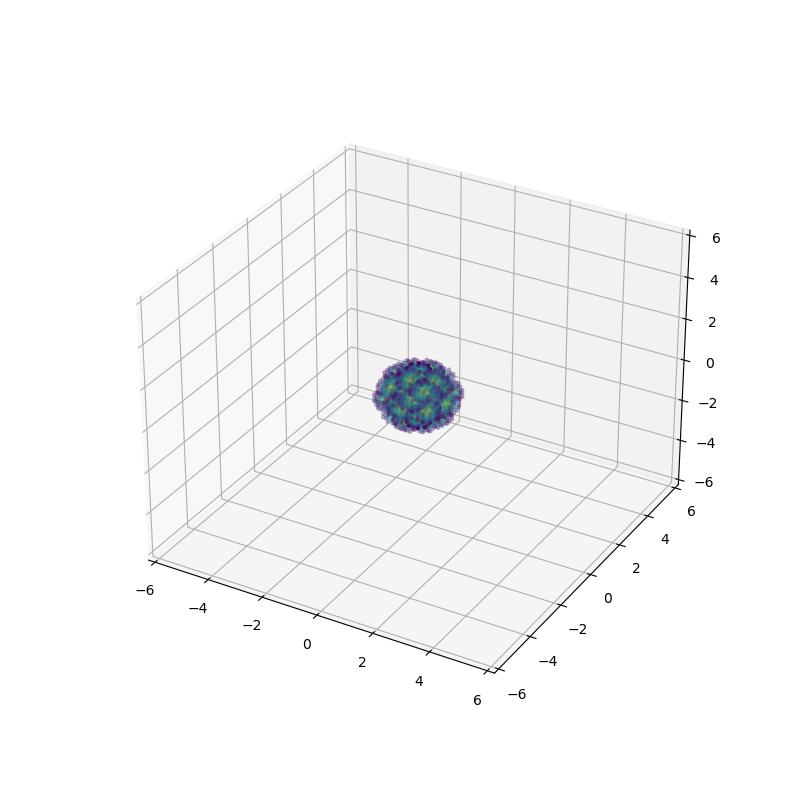

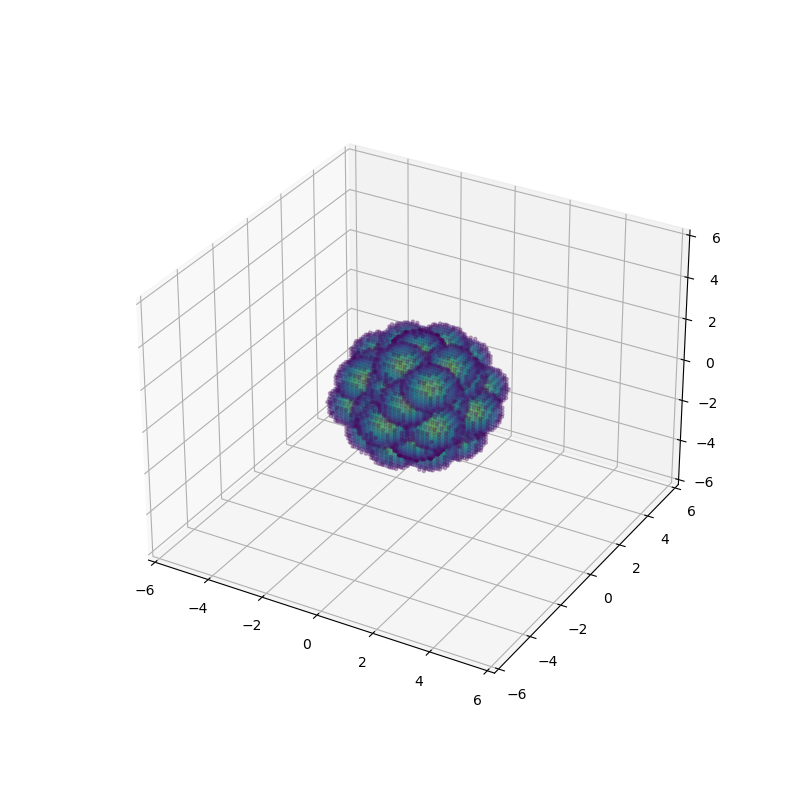

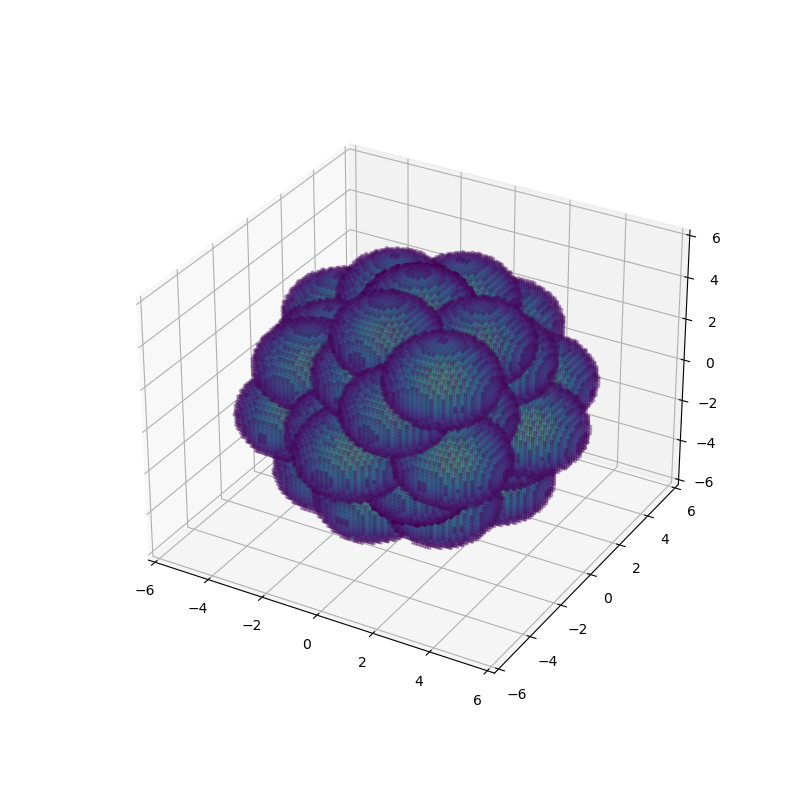

In [218]:
def create_filter_mesh(scale,orientation,elevation,space=np.linspace(-5,5,num=50)):
    xs, ys, zs = np.meshgrid(space, space, space)
    filter = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=False, separate_pairs=False)
    filter_amplitude = np.abs(filter)
    max_amplitude = np.max(filter_amplitude)
    keep_mask = np.where(filter_amplitude > (max_amplitude/2))    
    xs = xs[keep_mask]
    ys = ys[keep_mask]
    zs = zs[keep_mask]
    filter_amplitude = filter_amplitude[keep_mask]
    return(xs,ys,zs,filter_amplitude)

#pick our scales & centers
scales = [1,2,4]
orientations = [0,pi/4,pi/2,3*pi/4]
elevations = [0,pi/4,pi/2,3*pi/4]

#all on one plot
#fig = plt.figure(figsize=(12, 8))
#ax = fig.add_subplot(111, projection='3d')
xyzspace = np.linspace(-6,6, num=75)

for k, scale in enumerate(scales):
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    for i, orientation in enumerate(orientations):
        #0,0 special case
        elevation=0
        xs,ys,zs,amps = create_filter_mesh(scale,orientation,elevation,space=xyzspace)
        ax.scatter(xs,ys,zs,c=amps,cmap='viridis',marker='.',alpha=0.3)
        
        for j, elevation in enumerate(elevations[1:]):
            xs,ys,zs,amps = create_filter_mesh(scale,orientation,elevation,space=xyzspace)
            ax.scatter(xs,ys,zs,c=amps,cmap='viridis',marker='.',alpha=0.3)

    ax.set_xlim(np.min(xyzspace), np.max(xyzspace))
    ax.set_ylim(np.min(xyzspace), np.max(xyzspace))
    ax.set_zlim(np.min(xyzspace), np.max(xyzspace))
    plt.show()


## How do these look in space/time filter domain?
These filters were created in the fourier domain, what do they look lik in the spatial domain?

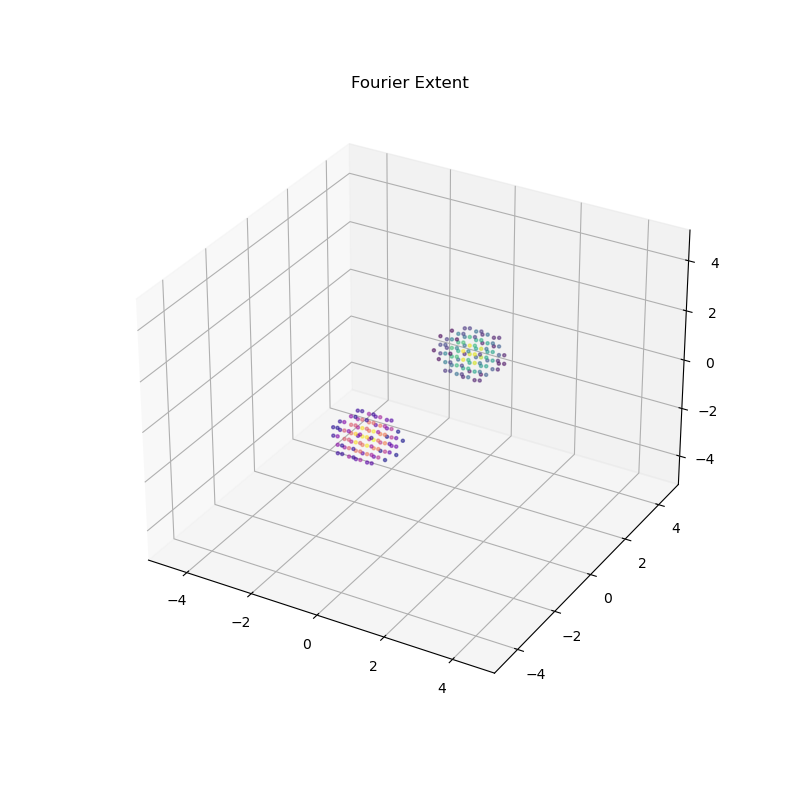

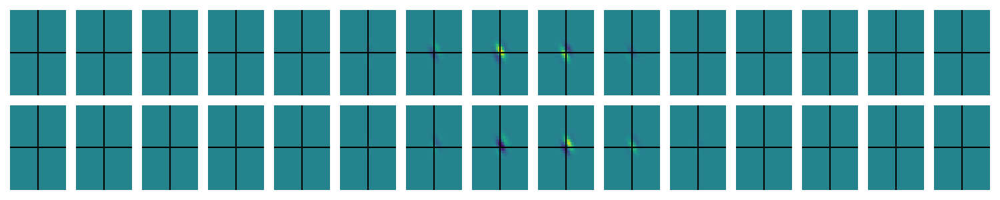

In [220]:
#demo one
def inverse_power_spec(filter):
    #complex_spec = ampspec * np.exp(1j * np.zeros_like(ampspec))
    filter = np.fft.ifftn(np.fft.ifftshift(filter)) #unshift 
    filter = np.fft.fftshift(filter)
    filter_real = np.real(filter) #real pair filter
    filter_imag = np.imag(filter) #imag pair filter
    return(filter_real,filter_imag)

#c/o chatgpt
def check_fourier_symmetry(F):
    # Check if the Fourier transform F has Hermitian symmetry
    # F should be a 2D array
    return np.allclose(F, np.conj(np.flipud(np.fliplr(F))))

def plot_filter_mesh(xs,ys,zs,filt,ax=None,use_keep_mask=True,cmap='viridis'):
    filter_amplitude = np.abs(filt)
    max_amplitude = np.max(filter_amplitude)
    if(use_keep_mask):
        keep_mask = np.where(filter_amplitude > (max_amplitude/2))    
        xs = xs[keep_mask]
        ys = ys[keep_mask]
        zs = zs[keep_mask]
        filter_amplitude = filter_amplitude[keep_mask]
    if(ax==None):
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111, projection='3d')
    ax.scatter(xs,ys,zs,c=filter_amplitude,cmap=cmap,marker='.',alpha=0.5)
    # fig.colorbar()
    return(ax)

scale=2
orientation=pi/4
elevation=pi/4
xyzspace = np.linspace(-5,5, num=30)
# Setup space progression
xs, ys, zs = np.meshgrid(xyzspace, xyzspace, xyzspace)
fourier_filter = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=False)
fourier_filter_real, fourier_filter_imag = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=True)


#plot
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax = plot_filter_mesh(xs,ys,zs,fourier_filter_real,ax,cmap='viridis')
ax = plot_filter_mesh(xs,ys,zs,fourier_filter_imag,ax,cmap='plasma')
ax.set_xlim(np.min(xyzspace), np.max(xyzspace))
ax.set_ylim(np.min(xyzspace), np.max(xyzspace))
ax.set_zlim(np.min(xyzspace), np.max(xyzspace))
#fig.colorbar()
plt.title('Fourier Extent')
plt.show()

#plot fourier Filters
fig = plt.figure(figsize=(15, 3))
filter_real, filter_imag = inverse_power_spec(fourier_filter)


#plot spatiotemporal filters
vmin=np.min((filter_real,filter_imag))
vmax=np.max((filter_real,filter_imag))
nslices = 15
slices = np.linspace(0,len(zs)-1,nslices,dtype=int)
f=0
for i in slices:
    f+=1
    plt.subplot(2,nslices,f)
    plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i],vmin=vmin,vmax=vmax)
    #plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i],cmap='Greys_r')
    plt.axis('off')
    plt.axhline(0,color='black') # x = 0
    plt.axvline(0,color='black') # y = 0
    plt.subplot(2,nslices,f+nslices)
    plt.pcolormesh(xyzspace, xyzspace, filter_imag[:,:,i],vmin=vmin,vmax=vmax)
    #plt.pcolormesh(xyzspace, xyzspace, filter_imag[:,:,i],cmap='Greys_r')
    plt.axis('off')
    plt.axhline(0,color='black') # x = 0
    plt.axvline(0,color='black') # y = 0
plt.tight_layout()
plt.show()


Scale 1
Orientation 0
Elevation 0


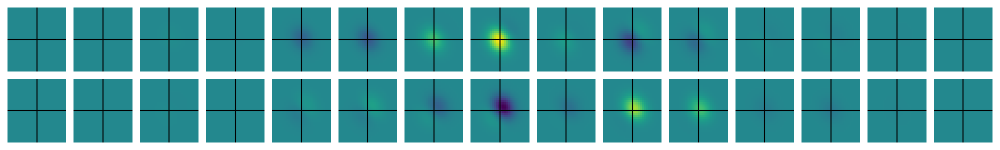

Scale 1
Orientation 0
Elevation 0.7853981633974483


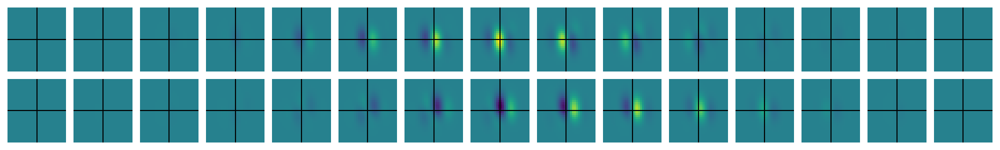

Scale 1
Orientation 0
Elevation 1.5707963267948966


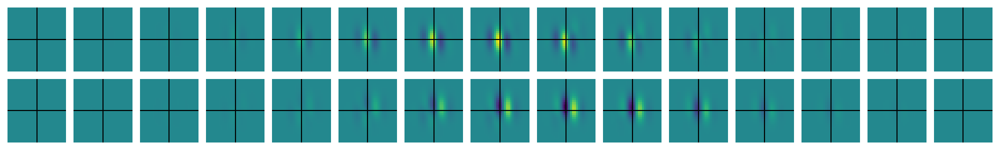

Scale 1
Orientation 0
Elevation 2.356194490192345


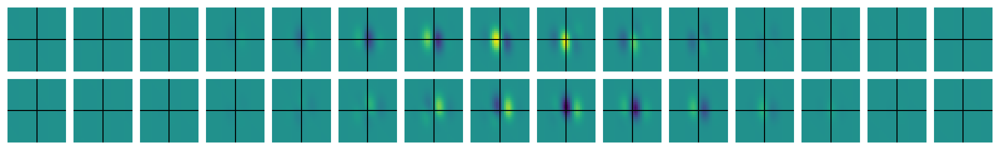

Scale 1
Orientation 0.7853981633974483
Elevation 0.7853981633974483


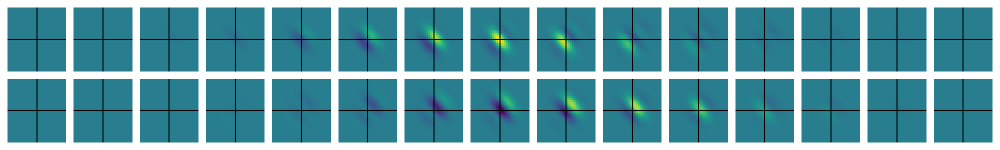

Scale 1
Orientation 0.7853981633974483
Elevation 1.5707963267948966


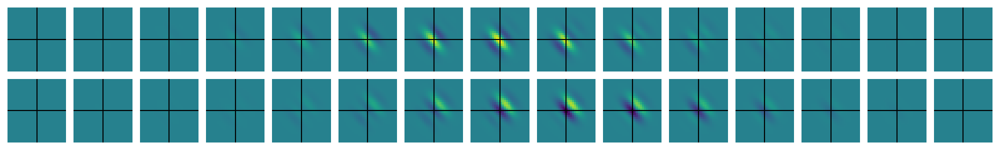

Scale 1
Orientation 0.7853981633974483
Elevation 2.356194490192345


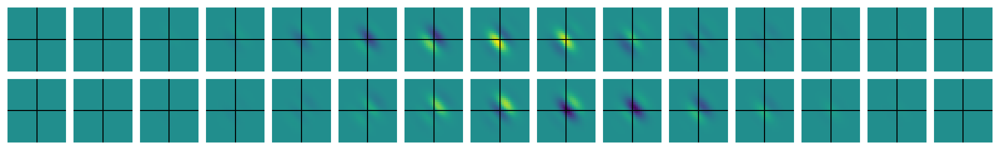

Scale 1
Orientation 1.5707963267948966
Elevation 0.7853981633974483


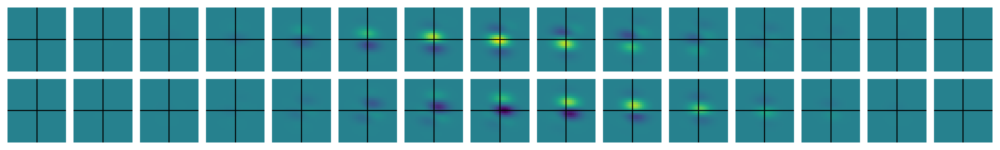

Scale 1
Orientation 1.5707963267948966
Elevation 1.5707963267948966


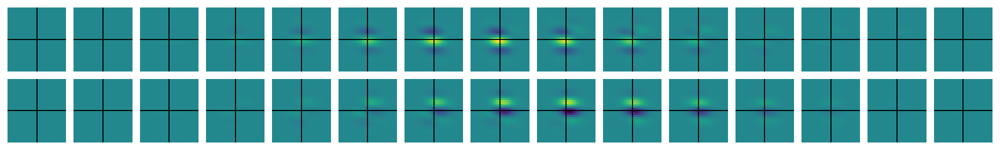

Scale 1
Orientation 1.5707963267948966
Elevation 2.356194490192345


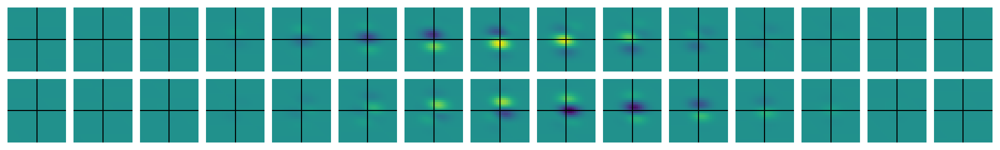

Scale 1
Orientation 2.356194490192345
Elevation 0.7853981633974483


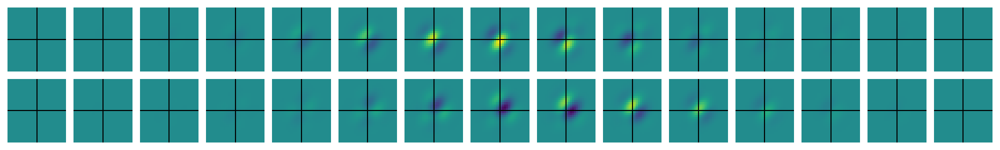

Scale 1
Orientation 2.356194490192345
Elevation 1.5707963267948966


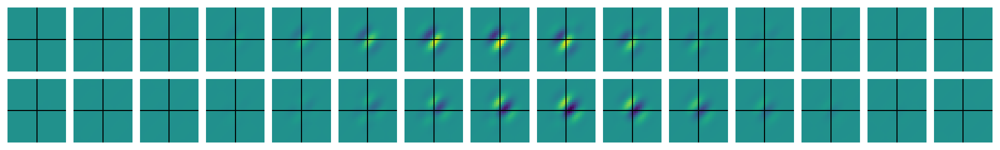

Scale 1
Orientation 2.356194490192345
Elevation 2.356194490192345


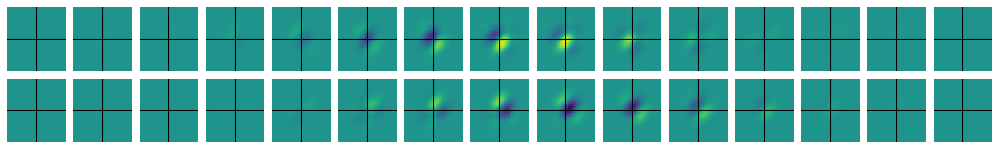

Scale 2
Orientation 0
Elevation 0


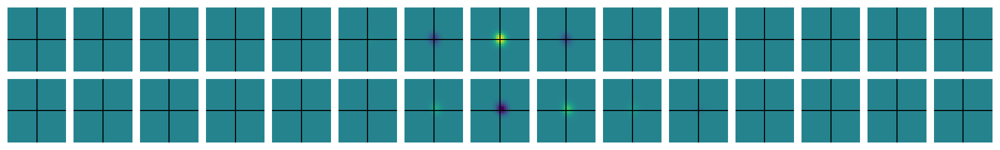

Scale 2
Orientation 0
Elevation 0.7853981633974483


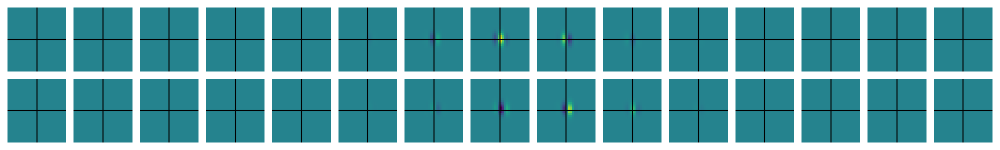

Scale 2
Orientation 0
Elevation 1.5707963267948966


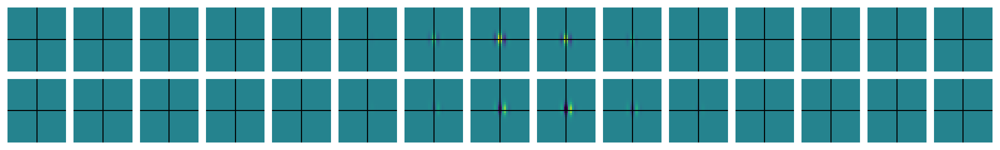

Scale 2
Orientation 0
Elevation 2.356194490192345


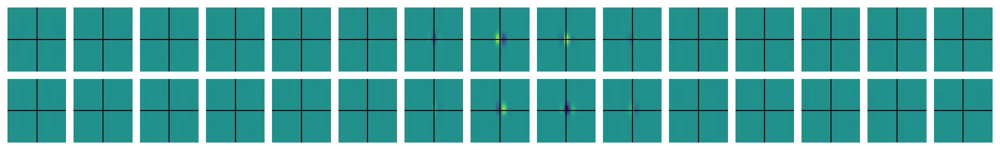

Scale 2
Orientation 0.7853981633974483
Elevation 0.7853981633974483


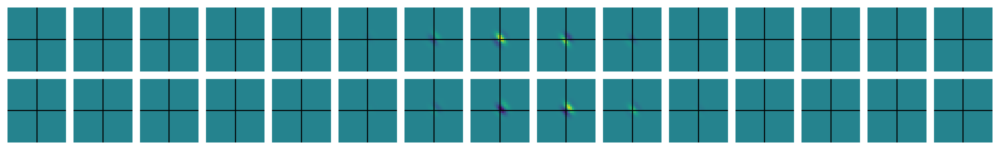

Scale 2
Orientation 0.7853981633974483
Elevation 1.5707963267948966


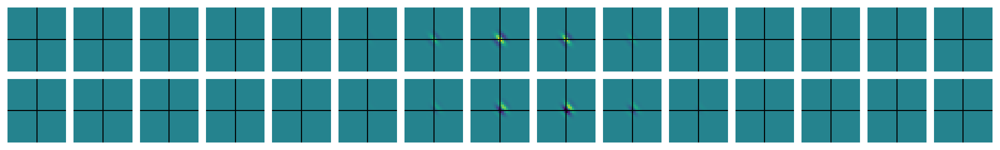

Scale 2
Orientation 0.7853981633974483
Elevation 2.356194490192345


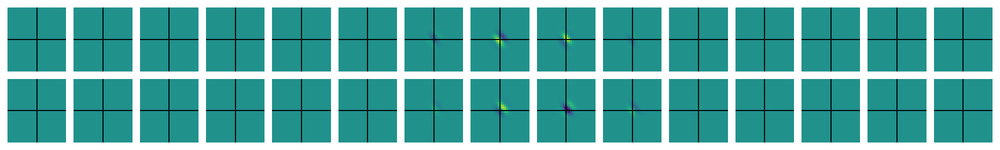

Scale 2
Orientation 1.5707963267948966
Elevation 0.7853981633974483


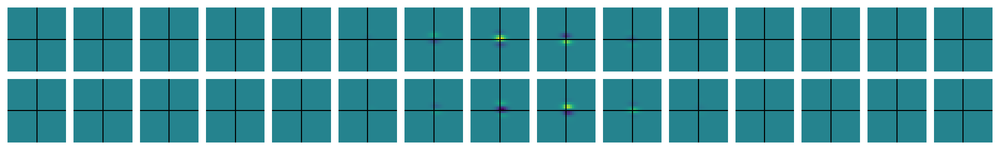

Scale 2
Orientation 1.5707963267948966
Elevation 1.5707963267948966


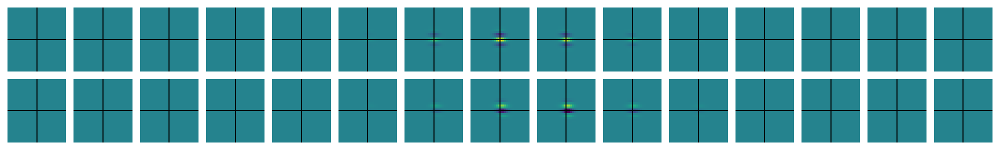

Scale 2
Orientation 1.5707963267948966
Elevation 2.356194490192345


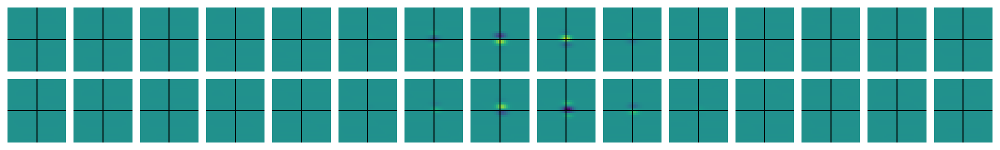

Scale 2
Orientation 2.356194490192345
Elevation 0.7853981633974483


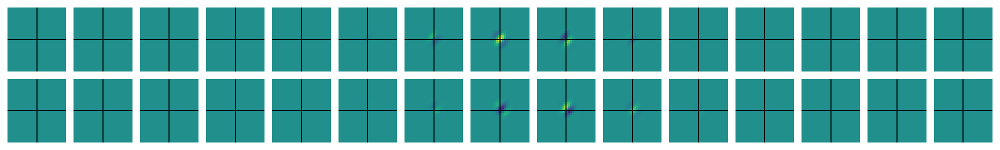

Scale 2
Orientation 2.356194490192345
Elevation 1.5707963267948966


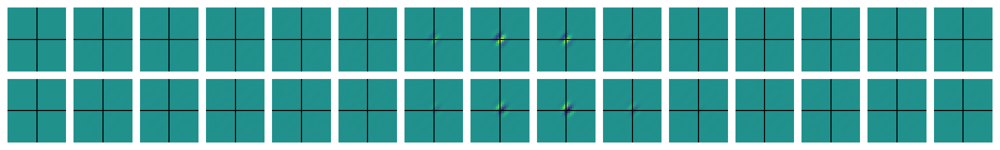

Scale 2
Orientation 2.356194490192345
Elevation 2.356194490192345


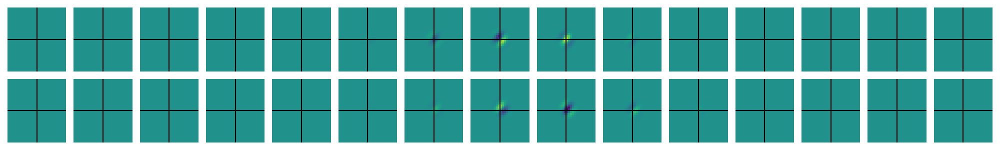

In [223]:
#pick our scales & centers
#scales = [1,2,4]
scales = [1,2]
orientations = [0,pi/4,pi/2,3*pi/4]
elevations = [0,pi/4,pi/2,3*pi/4]

xyzspace = np.linspace(-5,5, num=30)
# Setup space progression
xs, ys, zs = np.meshgrid(xyzspace, xyzspace, xyzspace)

for k, scale in enumerate(scales):
    orientation=0
    elevation=0
    print(f'Scale {scale}')
    print(f'Orientation {orientation}')
    print(f'Elevation {elevation}')
    
    fourier_filter = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=False)
    filter_real, filter_imag = inverse_power_spec(fourier_filter)
    
    #plot spatiotemporal filters
    fig = plt.figure(figsize=(20, 3))
    vmin=np.min((filter_real,filter_imag))
    vmax=np.max((filter_real,filter_imag))
    nslices = 15
    slices = np.linspace(0,len(zs)-1,nslices,dtype=int)
    f=0
    for i in slices:
        f+=1
        plt.subplot(2,nslices,f)
        # filter_pair = np.concatenate((filter_real, filter_imag), axis=0)
        plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i],vmin=vmin,vmax=vmax)
        #plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i])
        plt.axis('off')
        #plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i])
        plt.axhline(0,color='black') # x = 0
        plt.axvline(0,color='black') # y = 0
        plt.subplot(2,nslices,f+nslices)
        plt.pcolormesh(xyzspace, xyzspace, filter_imag[:,:,i],vmin=vmin,vmax=vmax)
        #plt.pcolormesh(xyzspace, xyzspace, filter_imag[:,:,i])
        #plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i])
        plt.axhline(0,color='black') # x = 0
        plt.axvline(0,color='black') # y = 0
        plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    for i, orientation in enumerate(orientations):        
        for j, elevation in enumerate(elevations[1:]):

            print(f'Scale {scale}')
            print(f'Orientation {orientation}')
            print(f'Elevation {elevation}')
            
            fourier_filter = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=False)
            filter_real, filter_imag = inverse_power_spec(fourier_filter)
            
            #plot spatiotemporal filters
            fig = plt.figure(figsize=(20, 3))
            vmin=np.min((filter_real,filter_imag))
            vmax=np.max((filter_real,filter_imag))
            nslices = 15
            slices = np.linspace(0,len(zs)-1,nslices,dtype=int)
            f=0
            for i in slices:
                f+=1
                plt.subplot(2,nslices,f)
                # filter_pair = np.concatenate((filter_real, filter_imag), axis=0)
                plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i],vmin=vmin,vmax=vmax)
                #plt.pcolormesh(xyzspace, xyzspace, filter_real[:,:,i])
                plt.axhline(0,color='black') # x = 0
                plt.axvline(0,color='black') # y = 0
                plt.axis('off')
                plt.subplot(2,nslices,f+nslices)
                plt.pcolormesh(xyzspace, xyzspace, filter_imag[:,:,i],vmin=vmin,vmax=vmax)
                #plt.pcolormesh(xyzspace, xyzspace, filter_imag[:,:,i])
                plt.axhline(0,color='black') # x = 0
                plt.axvline(0,color='black') # y = 0
                plt.axis('off')
            plt.tight_layout()
            plt.show()



## Make a movie

In [229]:
import matplotlib.animation as animation
import os

#pick our scales & centers
#scales = [1,2,4]
scales = [1,2]
orientations = [0,pi/4,pi/2,3*pi/4]
elevations = [0,pi/4,pi/2,3*pi/4]

# Setup space progression
xyzspace = np.linspace(-5,5, num=30)
xs, ys, zs = np.meshgrid(xyzspace, xyzspace, xyzspace)

# fig, axes = plt.subplots(2, 15, figsize=(20, 6))

# Create output directory
output_dir = 'filter_movies'
os.makedirs(output_dir, exist_ok=True)

def create_movie(scale, orientation, elevation, filter_real, filter_imag, filename):
    fig, axes = plt.subplots(2, 1, figsize=(10, 8))
    vmin = np.min((filter_real, filter_imag))
    vmax = np.max((filter_real, filter_imag))
    nslices = len(zs)
    slices = np.linspace(0, nslices-1, nslices, dtype=int)

    def update_plot(frame):
        slice_idx = slices[frame]
        axes[0].clear()
        axes[1].clear()
        axes[0].pcolormesh(xyzspace, xyzspace, filter_real[:, :, slice_idx], vmin=vmin, vmax=vmax)
        axes[0].set_title(f'Real part, Slice {slice_idx}')
        axes[1].pcolormesh(xyzspace, xyzspace, filter_imag[:, :, slice_idx], vmin=vmin, vmax=vmax)
        axes[1].set_title(f'Imaginary part, Slice {slice_idx}')
        for ax in axes:
            ax.axhline(0, color='black') # x = 0
            ax.axvline(0, color='black') # y = 0
            ax.axis('off')

    ani = animation.FuncAnimation(fig, update_plot, frames=nslices, repeat=False)
    ani.save(filename, writer='ffmpeg', fps=6)
    plt.close(fig)

for k, scale in enumerate(scales):
    for i, orientation in enumerate(orientations):
        for j, elevation in enumerate(elevations):
            print(f'Generating movie for Scale {scale}, Orientation {orientation}, Elevation {elevation}')
            
            fourier_filter = quadrature_gaussian_filter_3d(xs, ys, zs, scale, orientation, elevation, norm=True, separate_pairs=False)
            filter_real, filter_imag = inverse_power_spec(fourier_filter)
            
            filename = os.path.join(output_dir, f'filter_scale{scale}_orientation{i}_elevation{j}.mp4')
            create_movie(scale, orientation, elevation, filter_real, filter_imag, filename)


Generating movie for Scale 1, Orientation 0, Elevation 0
Generating movie for Scale 1, Orientation 0, Elevation 0.7853981633974483
Generating movie for Scale 1, Orientation 0, Elevation 1.5707963267948966
Generating movie for Scale 1, Orientation 0, Elevation 2.356194490192345
Generating movie for Scale 1, Orientation 0.7853981633974483, Elevation 0
Generating movie for Scale 1, Orientation 0.7853981633974483, Elevation 0.7853981633974483
Generating movie for Scale 1, Orientation 0.7853981633974483, Elevation 1.5707963267948966
Generating movie for Scale 1, Orientation 0.7853981633974483, Elevation 2.356194490192345
Generating movie for Scale 1, Orientation 1.5707963267948966, Elevation 0
Generating movie for Scale 1, Orientation 1.5707963267948966, Elevation 0.7853981633974483
Generating movie for Scale 1, Orientation 1.5707963267948966, Elevation 1.5707963267948966
Generating movie for Scale 1, Orientation 1.5707963267948966, Elevation 2.356194490192345
Generating movie for Scale 1, 